<a href="https://colab.research.google.com/github/akasharunabharathi/hand-gan/blob/main/HandGan.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import torch
from torch.utils.data import DataLoader
from torchvision import transforms
from torchvision.datasets import ImageFolder
import torch.nn as nn

import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import matplotlib.gridspec as gridspec
from PIL import Image

import numpy as np
import pandas as pd

import os
from os import listdir

%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

%load_ext autoreload
%autoreload 2

In [ ]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
device

device(type='cuda', index=0)

# Downloading and Preprocessing Data

**Hands and Palms Images Dataset**

All images from the Hands and Palm Images Dataset are of 1200 x 1600 pixels in size. To efficiently train our data without using excessive GPU time, we're resizing all images to a 64 x 64 size.

In [ ]:
# get the path/directory
base_dir = "/kaggle/input/hands-and-palm-images-dataset/Hands/Hands"
output_dir = "/kaggle/working/Hands/Hands"
os.makedirs(output_dir)

num_null_imgs = 0
for image_dir in os.listdir(base_dir):
    # check if the image ends with png
    if (image_dir.endswith(".jpg")):
        img_path = os.path.join(base_dir,image_dir)
        image = Image.open(img_path)
        # print("Image size before resizing: " + str(image.size))
        transformed_img = transforms.Resize((64,64))(image)
        transformed_img_path = os.path.join(output_dir, image_dir)
        # print("Image size after resizing: " + str(transformed_img.size))
        if image_dir in os.listdir(output_dir):
            print(transformed_img_path)
            os.rmdir(transformed_img_path)
        transformed_img.save(transformed_img_path)

print("Process Complete")

In [ ]:
hands = pd.read_csv("/kaggle/input/hands-and-palm-images-dataset/HandInfo.csv")

hands_sample = hands.sample(6)
filepaths_sample = list(hands_sample["imageName"])
labels_sample = list(hands_sample["aspectOfHand"])
base_dir = "/kaggle/working/Hands/Hands"
img_list = list()

for index in range(hands_sample.shape[0]):
    filepath = filepaths_sample[index]
    label = labels_sample[index]
    img_path = mpimg.imread(os.path.join(base_dir, filepath))
    img_list.append(img_path)

num_rows = 2
num_cols = 3
fig, axes = plt.subplots(num_rows, num_cols)

row = 0
for img_index in range(0, len(img_list), 1):
    print(img_list[img_index].shape)
    if img_index % 3 == 0 and img_index != 0:
        row += 1
    axes[row, img_index % num_cols].imshow(img_list[img_index])
    axes[row, img_index % num_cols].set_title(labels_sample[img_index])

fig.tight_layout()
plt.show()

**EgoHands Dataset**

**Defining our Models**

In [ ]:
class Discriminator(torch.nn.Module):
    def __init__(self, input_channels=3):
        super(Discriminator, self).__init__()

        ndf = 128
        self.main = nn.Sequential(
            # input is ``(input_channels) x 64 x 64``
            nn.Conv2d(input_channels, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf) x 32 x 32``
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf*2) x 16 x 16``
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf*4) x 8 x 8``
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf*8) x 4 x 4``
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
        )

    def forward(self, x):

        return self.main(x)


class Generator(torch.nn.Module):
    def __init__(self, noise_dim, output_channels=3):
        super(Generator, self).__init__()
        self.noise_dim = noise_dim
        ngf = 128
        self.main = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d(self.noise_dim, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            # state size. ``(ngf*8) x 4 x 4``
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # state size. ``(ngf*4) x 8 x 8``
            nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # state size. ``(ngf*2) x 16 x 16``
            nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # state size. ``(ngf) x 32 x 32``
            nn.ConvTranspose2d(ngf, output_channels, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. ``(nc) x 64 x 64``
        )

    def forward(self, x):
        return self.main(x)

**Defining Loss Functions for our GANs**

The ```discriminator_loss()``` function:

Computes the discriminator loss.

You should use the stable torch.nn.functional.binary_cross_entropy_with_logits
loss rather than using a separate softmax function followed by the binary cross
entropy loss.

Inputs:
- logits_real: PyTorch Tensor of shape (N,) giving scores for the real data.
- logits_fake: PyTorch Tensor of shape (N,) giving scores for the fake data.

Returns:
- loss: PyTorch Tensor containing (scalar) the loss for the discriminator.

The ```generator_loss()``` function:

Computes the generator loss.
    
You should use the stable torch.nn.functional.binary_cross_entropy_with_logits
loss rather than using a separate softmax function followed by the binary cross
entropy loss.

Inputs:
- logits_fake: PyTorch Tensor of shape (N,) giving scores for the fake data.

Returns:
- loss: PyTorch Tensor containing the (scalar) loss for the generator.

In [ ]:
from torch.nn.functional import binary_cross_entropy_with_logits as bce_loss

def discriminator_loss(logits_real, logits_fake):

    loss = 0

    # The discriminator returns the probability of a sample being from the training data rather than being generated
    # i.e. it should output 1 for images from training data (real images) and 0 for generated images (fake images)

    loss_real_imgs = torch.mean(bce_loss(logits_real, torch.ones_like(logits_real)))
    loss_fake_imgs = torch.mean(bce_loss(logits_fake, torch.zeros_like(logits_fake)))

    loss = loss_real_imgs + loss_fake_imgs
    return loss

def generator_loss(logits_fake):
    loss = torch.mean(bce_loss(logits_fake, torch.ones_like(logits_fake)))
    return loss


def ls_discriminator_loss(scores_real, scores_fake):
    """
    Compute the Least-Squares GAN loss for the discriminator.

    Inputs:
    - scores_real: PyTorch Tensor of shape (N,) giving scores for the real data.
    - scores_fake: PyTorch Tensor of shape (N,) giving scores for the fake data.

    Outputs:
    - loss: A PyTorch Tensor containing the loss.
    """
    loss_real = torch.mean((scores_real - torch.ones_like(scores_real).detach())**2)
    loss_fake = torch.mean((scores_fake)**2)

    loss = 1/2 * (loss_real + loss_fake)
    return loss

def ls_generator_loss(scores_fake):
    """
    Computes the Least-Squares GAN loss for the generator.

    Inputs:
    - scores_fake: PyTorch Tensor of shape (N,) giving scores for the fake data.

    Outputs:
    - loss: A PyTorch Tensor containing the loss.
    """
    # Why use 1 here? Remember the discriminator returns 1 for images for training data.
    # The generator's task is to make the discriminator think the images
    # it generated came from training data
    # So 1 is the target for each of the generator's images.
    loss = 1/2 * torch.mean((scores_fake - torch.ones_like(scores_fake).detach()) ** 2)
    return loss

**Utility functions**

In [ ]:
import matplotlib.pyplot as plt

def show_images(images, color=False):
    if color:
        sqrtimg = int(np.ceil(np.sqrt(images.shape[2]*images.shape[3])))
    else:
        images = np.reshape(images, [images.shape[0], -1])  # images reshape to (batch_size, D)
        sqrtimg = int(np.ceil(np.sqrt(images.shape[1])))
    sqrtn = int(np.ceil(np.sqrt(images.shape[0])))


    fig = plt.figure(figsize=(sqrtn, sqrtn))
    gs = gridspec.GridSpec(sqrtn, sqrtn)
    gs.update(wspace=0.05, hspace=0.05)

    for i, img in enumerate(images):
        ax = plt.subplot(gs[i])
        plt.axis('off')
        ax.set_xticklabels([])
        ax.set_yticklabels([])
        ax.set_aspect('equal')
        if color:
            plt.imshow(np.swapaxes(np.swapaxes(img, 0, 1), 1, 2))
        else:
            plt.imshow(img.reshape([sqrtimg,sqrtimg]))
    return

def preprocess_img(x):
    return 2 * x - 1.0

def deprocess_img(x):
    return (x + 1.0) / 2.0

def rel_error(x,y):
    return np.max(np.abs(x - y) / (np.maximum(1e-8, np.abs(x) + np.abs(y))))

def sample_noise(batch_size, dim):
    """
    Generate a PyTorch Tensor of uniform random noise.

    Input:
    - batch_size: Integer giving the batch size of noise to generate.
    - dim: Integer giving the dimension of noise to generate.

    Output:
    - A PyTorch Tensor of shape (batch_size, dim) containing uniform
      random noise in the range (-1, 1).
    """
    to_return = torch.randn((batch_size, dim))
    return to_return/torch.max(to_return)




**The training loop**

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import torch

def train(D, G, D_solver, G_solver, discriminator_loss, generator_loss, in_channels, img_size, show_every=250,
              batch_size=128, noise_size=100, num_epochs=10, train_loader=None, device=None):
    """
    Train loop for GAN.

    The loop will consist of two steps: a discriminator step and a generator step.

    (1) In the discriminator step, you should zero gradients in the discriminator
    and sample noise to generate a fake data batch using the generator. Calculate
    the discriminator output for real and fake data, and use the output to compute
    discriminator loss. Call backward() on the loss output and take an optimizer
    step for the discriminator.

    (2) For the generator step, you should once again zero gradients in the generator
    and sample noise to generate a fake data batch. Get the discriminator output
    for the fake data batch and use this to compute the generator loss. Once again
    call backward() on the loss and take an optimizer step.

    You will need to reshape the fake image tensor outputted by the generator to
    be dimensions (batch_size x input_channels x img_size x img_size).

    Use the sample_noise function to sample random noise, and the discriminator_loss
    and generator_loss functions for their respective loss computations.


    Inputs:
    - D, G: PyTorch models for the discriminator and generator
    - D_solver, G_solver: torch.optim Optimizers to use for training the
      discriminator and generator.
    - discriminator_loss, generator_loss: Functions to use for computing the generator and
      discriminator loss, respectively.
    - show_every: Show samples after every show_every iterations.
    - batch_size: Batch size to use for training.
    - noise_size: Dimension of the noise to use as input to the generator.
    - num_epochs: Number of epochs over the training dataset to use for training.
    - train_loader: image dataloader
    - device: PyTorch device
    """
    iter_count = 0
    for epoch in range(num_epochs):
        print('EPOCH: ', (epoch+1))
        for x, _ in train_loader:
            _, input_channels, img_size, _ = x.shape

            real_images = preprocess_img(x).to(device)  # normalize

            # Store discriminator loss output, generator loss output, and fake image output
            # in these variables for logging and visualization below
            d_error = None
            g_error = None
            fake_images = None

            # Discriminator step.
            # Remember, D is the model, D_solver is the optimizer.

            D_solver.zero_grad()
            noise = sample_noise(batch_size, noise_size).to(device)
            noise = noise.view(batch_size, noise_size, 1, 1)
            fake_images = G(noise).view(batch_size, in_channels, img_size, img_size).detach()
            logits_fake = D(fake_images)
            logits_real = D(real_images)
            d_error = discriminator_loss(logits_real, logits_fake)
            d_error.backward()
            D_solver.step()

            # Generator Step
            # Remember, G is the Generator, G_solver is the optimizer.

            G_solver.zero_grad()
            noise = sample_noise(batch_size, noise_size).to(device)
            noise = noise.view(batch_size, noise_size, 1, 1)
            fake_images = G(noise).view(batch_size, in_channels, img_size, img_size)
            logits_fake = D(fake_images)
            g_error = generator_loss(logits_fake)
            g_error.backward()
            G_solver.step()

            # Logging and output visualization
            if (iter_count % show_every == 0):
                print('Iter: {}, D: {:.4}, G:{:.4}'.format(iter_count,d_error.item(),g_error.item()))
                disp_fake_images = deprocess_img(fake_images.data)  # denormalize
                imgs_numpy = (disp_fake_images).cpu().numpy()
                show_images(imgs_numpy[0:16], color=input_channels!=1)
                plt.show()
                print()
            iter_count += 1

# Loading Data

Process Complete


In [ ]:
batch_size = 32
imsize = 64
hand_root = '/kaggle/working/Hands'

hands_train = ImageFolder(root=hand_root, transform=transforms.Compose([
  transforms.ToTensor(),
  # Example use of RandomCrop
  transforms.Resize(int(1.15 * imsize)),
  transforms.RandomCrop(imsize),
  transforms.RandomHorizontalFlip(0.3),
  transforms.ColorJitter(brightness=.1, hue=.05),
  transforms.RandomVerticalFlip(0.25)
]))

hand_loader_train = DataLoader(hands_train, batch_size=batch_size, drop_last=True)


(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)
(64, 64, 3)


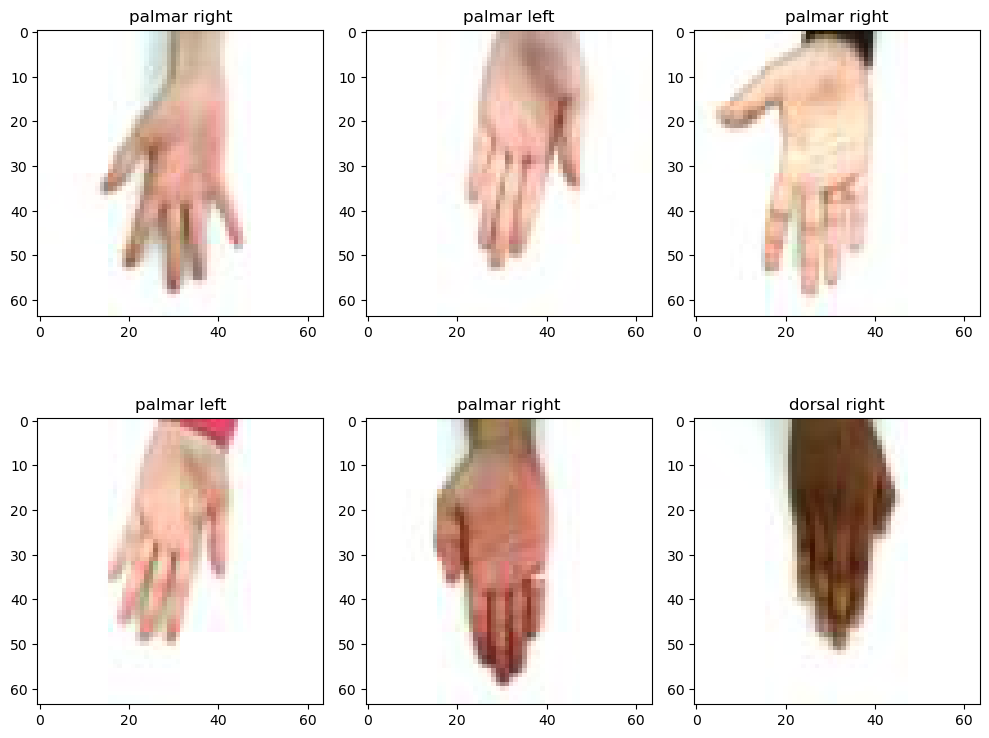

# Training the Model

In [ ]:
NOISE_DIM = 100
NUM_EPOCHS = 50
learning_rate = 0.001

In [ ]:
D = Discriminator().to(device)
G = Generator(noise_dim=NOISE_DIM).to(device)

In [ ]:
D_optimizer = torch.optim.Adam(D.parameters(), lr=learning_rate, betas = (0.5, 0.999))
G_optimizer = torch.optim.Adam(G.parameters(), lr=learning_rate, betas = (0.5, 0.999))

EPOCH:  1
Iter: 0, D: 1.298, G:16.53


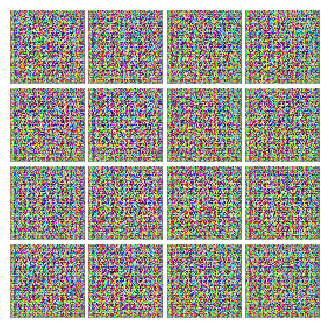


Iter: 250, D: 1.604, G:0.8235


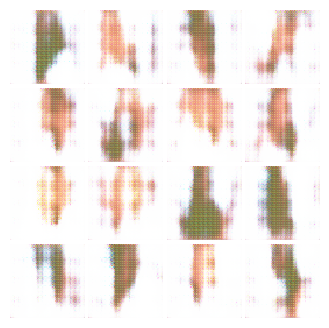


EPOCH:  2
Iter: 500, D: 0.4098, G:3.263


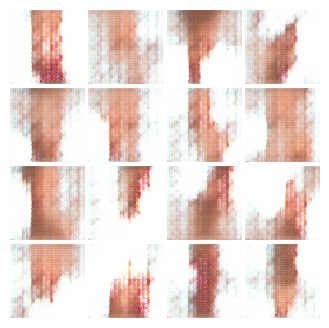


EPOCH:  3
Iter: 750, D: 0.9982, G:3.336


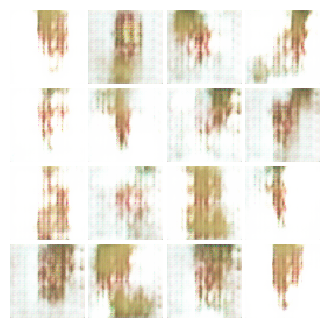


Iter: 1000, D: 0.9493, G:2.514


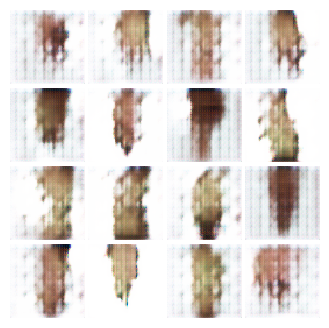


EPOCH:  4
Iter: 1250, D: 2.56, G:4.251


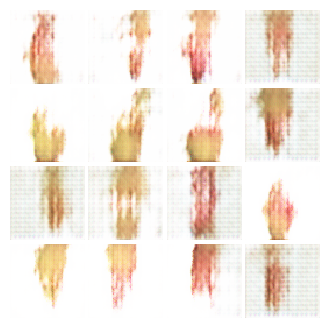


EPOCH:  5
Iter: 1500, D: 1.453, G:3.273


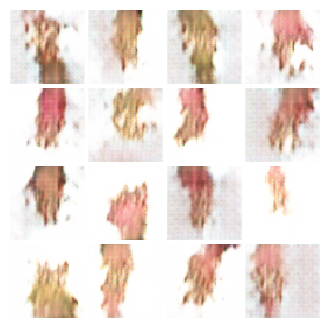


EPOCH:  6
Iter: 1750, D: 1.116, G:2.237


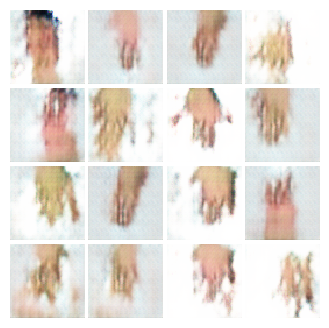


Iter: 2000, D: 0.5748, G:2.06


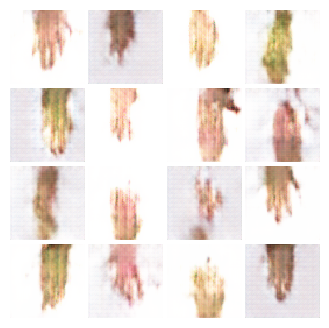


EPOCH:  7
Iter: 2250, D: 0.6882, G:1.857


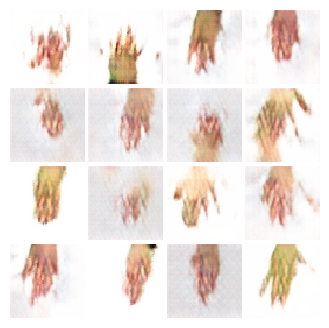


EPOCH:  8
Iter: 2500, D: 0.8268, G:3.484


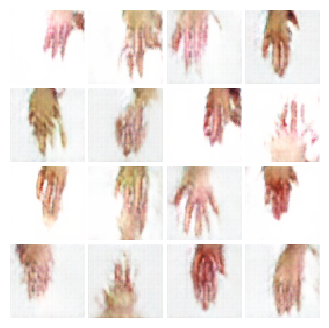


Iter: 2750, D: 0.8539, G:1.88


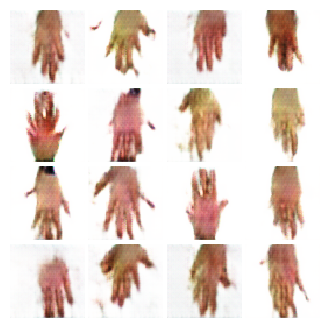


EPOCH:  9
Iter: 3000, D: 0.7412, G:1.514


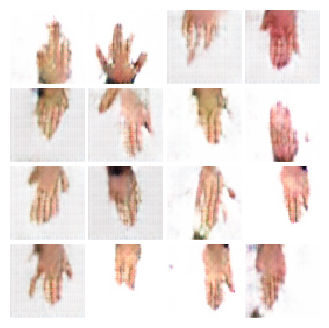


EPOCH:  10
Iter: 3250, D: 0.7737, G:2.676


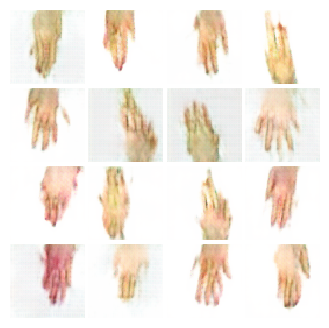


EPOCH:  11
Iter: 3500, D: 0.8422, G:2.498


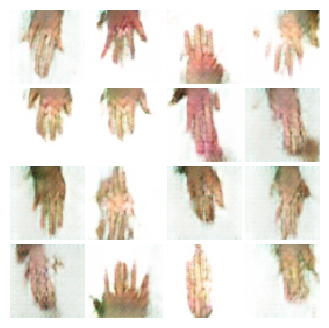


Iter: 3750, D: 0.9187, G:2.992


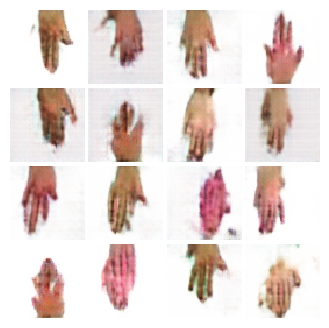


EPOCH:  12
Iter: 4000, D: 0.9745, G:0.4596


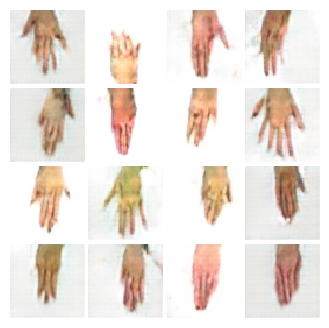


EPOCH:  13
Iter: 4250, D: 1.061, G:2.463


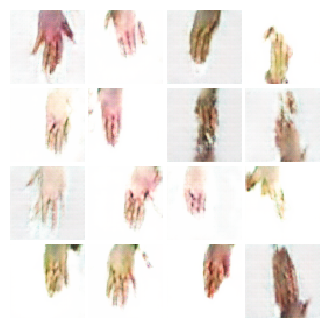


EPOCH:  14
Iter: 4500, D: 0.7642, G:3.154


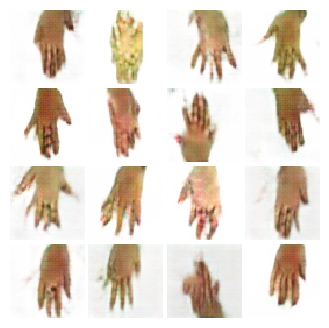


Iter: 4750, D: 0.5686, G:2.466


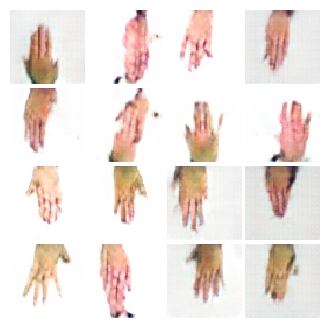


EPOCH:  15
Iter: 5000, D: 0.2443, G:2.636


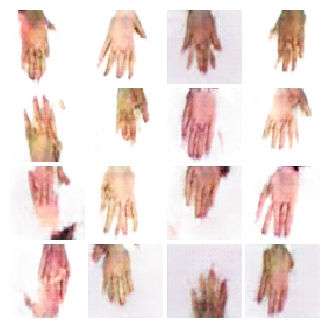


EPOCH:  16
Iter: 5250, D: 1.158, G:1.2


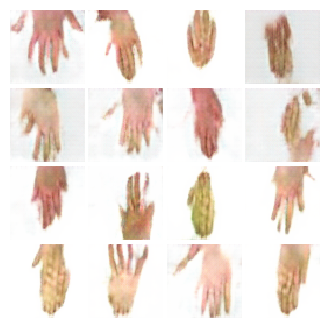


Iter: 5500, D: 0.4863, G:3.227


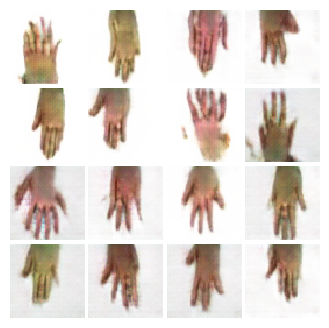


EPOCH:  17
Iter: 5750, D: 0.2344, G:3.348


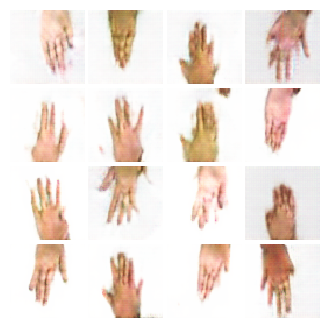


EPOCH:  18
Iter: 6000, D: 0.8755, G:1.354


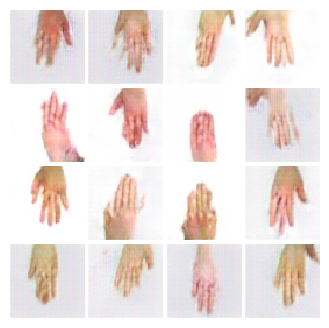


EPOCH:  19
Iter: 6250, D: 2.144, G:4.082


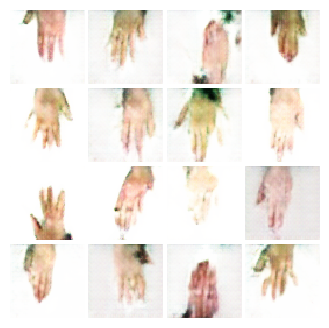


Iter: 6500, D: 0.7139, G:2.444


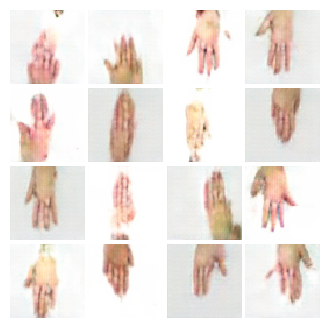


EPOCH:  20
Iter: 6750, D: 0.9076, G:2.072


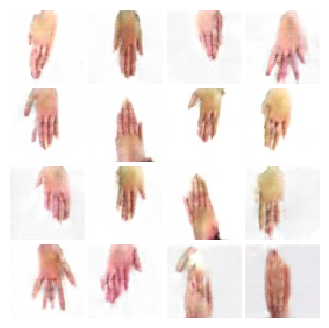


EPOCH:  21
Iter: 7000, D: 0.4054, G:2.87


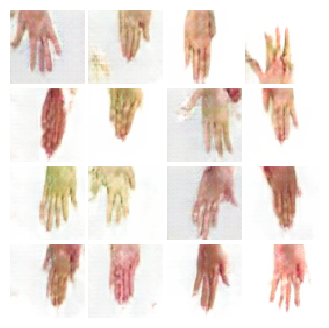


Iter: 7250, D: 0.4799, G:2.617


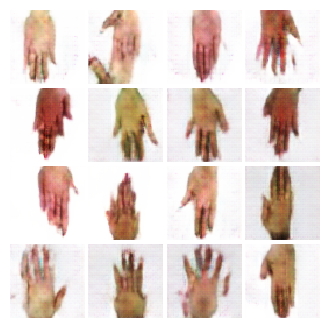


EPOCH:  22
Iter: 7500, D: 0.8619, G:3.173


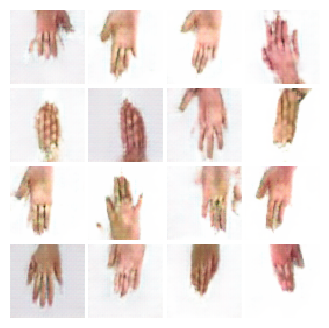


EPOCH:  23
Iter: 7750, D: 0.514, G:2.731


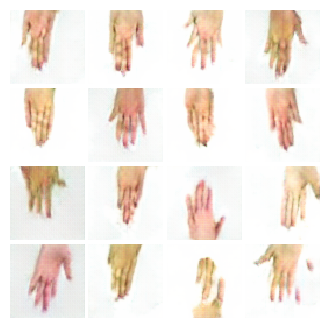


EPOCH:  24
Iter: 8000, D: 0.6406, G:1.874


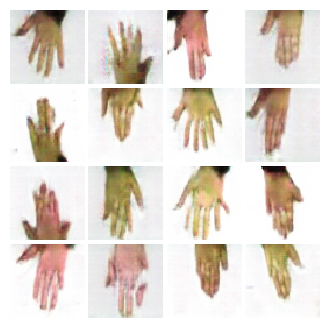


Iter: 8250, D: 1.757, G:2.699


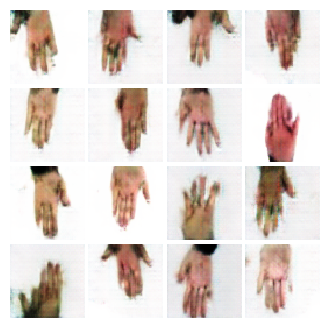


EPOCH:  25
Iter: 8500, D: 0.627, G:5.037


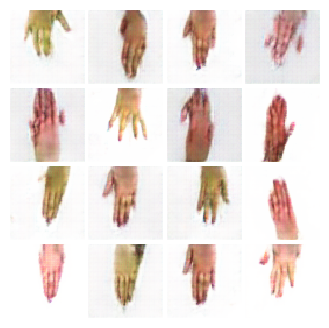


EPOCH:  26
Iter: 8750, D: 0.7159, G:2.945


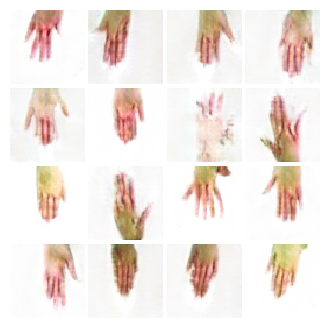


EPOCH:  27
Iter: 9000, D: 0.5979, G:3.383


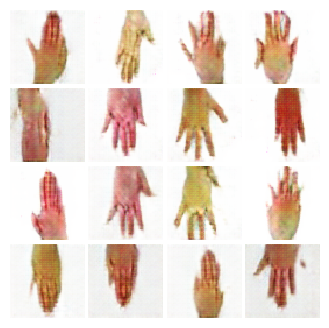


Iter: 9250, D: 0.4806, G:2.475


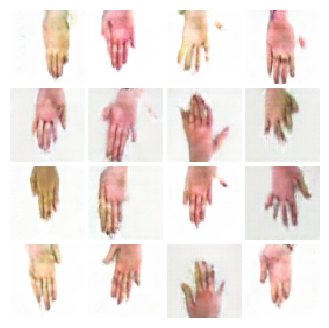


EPOCH:  28
Iter: 9500, D: 0.5972, G:3.165


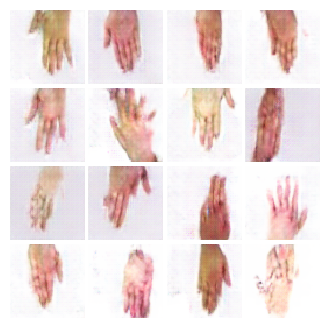


Iter: 10000, D: 0.1767, G:3.332


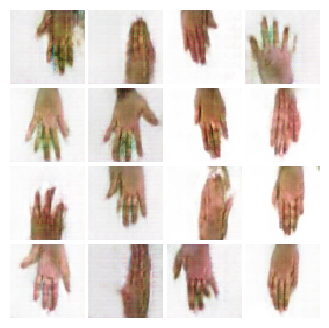


EPOCH:  30
Iter: 10250, D: 0.4833, G:3.458


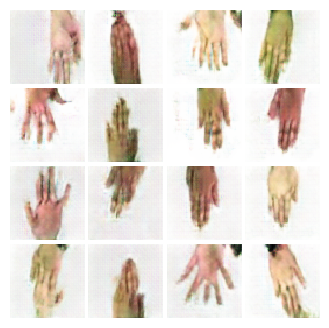


EPOCH:  31
Iter: 10500, D: 0.4383, G:2.474


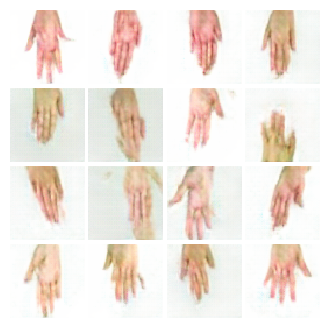


EPOCH:  32
Iter: 10750, D: 2.091, G:5.855


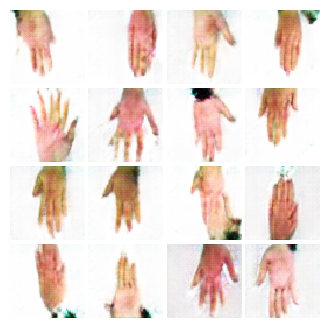


Iter: 11000, D: 0.5177, G:3.881


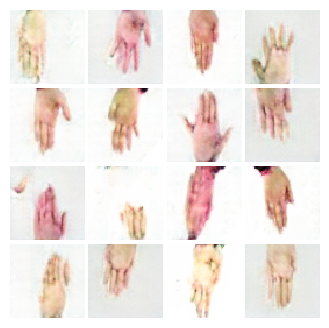


EPOCH:  33
Iter: 11250, D: 0.3099, G:2.831


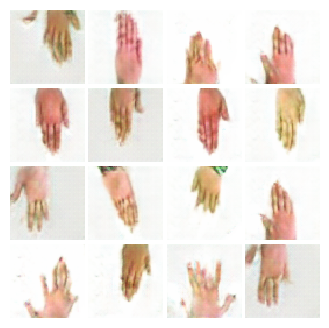


EPOCH:  34
Iter: 11500, D: 1.885, G:7.233


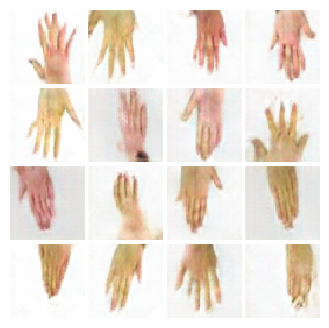


Iter: 11750, D: 0.6668, G:2.326


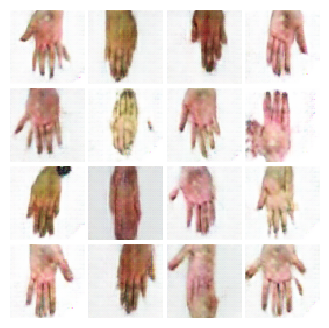


EPOCH:  35
Iter: 12000, D: 0.5929, G:2.842


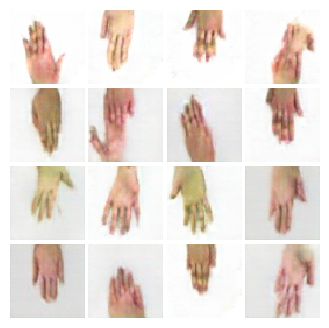


EPOCH:  36
Iter: 12250, D: 0.07034, G:5.303


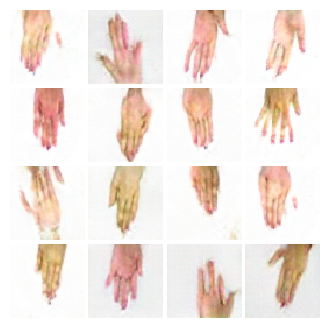


EPOCH:  37
Iter: 13000, D: 0.3125, G:4.499


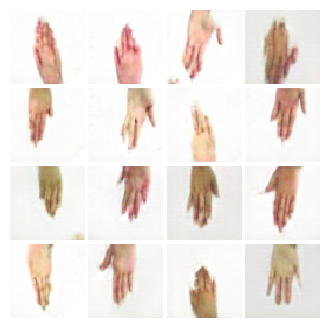


EPOCH:  39
Iter: 13250, D: 0.127, G:3.029


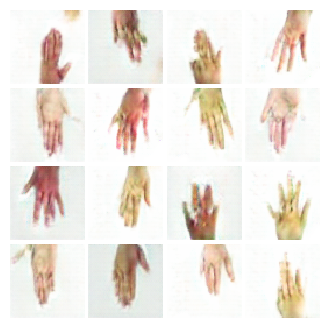


EPOCH:  40
Iter: 13500, D: 0.2959, G:3.062


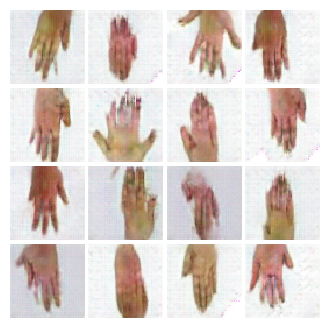


Iter: 13750, D: 0.5871, G:5.487


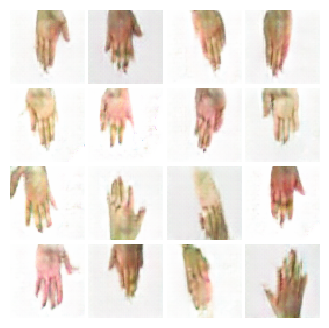


EPOCH:  41
Iter: 14000, D: 0.4132, G:3.673


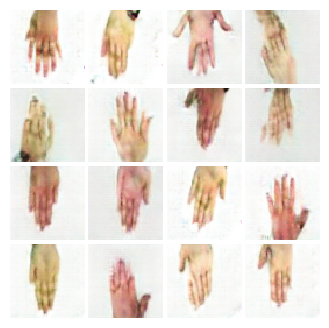


EPOCH:  42
Iter: 14250, D: 0.1782, G:3.34


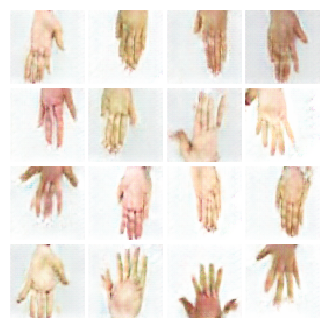


Iter: 14500, D: 0.02781, G:4.634


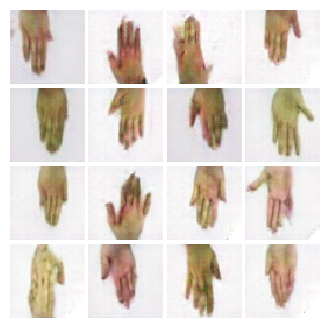


EPOCH:  43
Iter: 14750, D: 0.03797, G:5.723


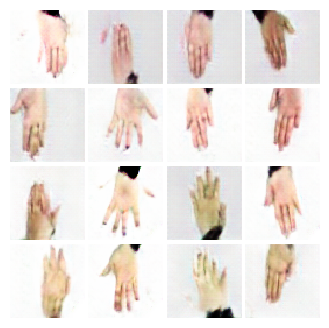


EPOCH:  44
Iter: 15000, D: 0.6085, G:6.303


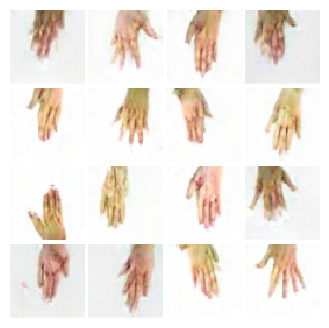


EPOCH:  45
Iter: 15250, D: 0.6109, G:3.314


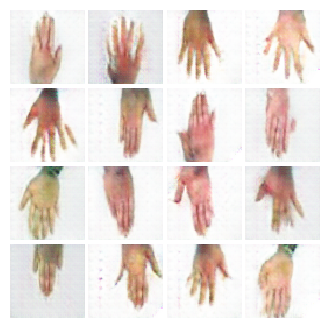


Iter: 15500, D: 0.05653, G:6.183


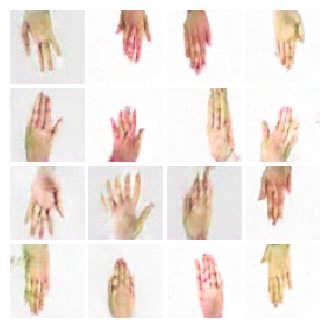


EPOCH:  46
Iter: 15750, D: 0.1454, G:3.37


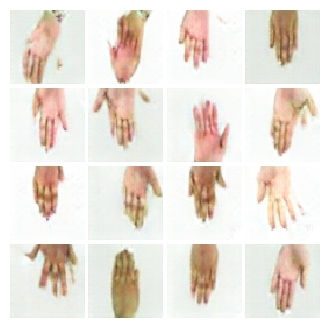


EPOCH:  47
Iter: 16000, D: 0.05745, G:4.511


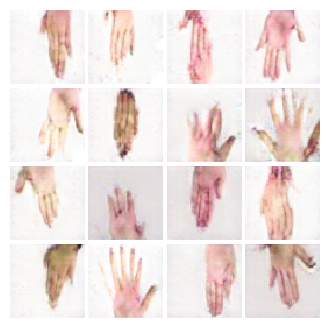


Iter: 16250, D: 0.03886, G:4.587


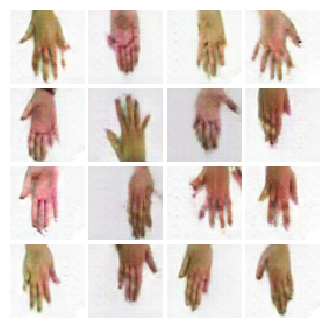


EPOCH:  48
Iter: 16500, D: 0.06181, G:6.054


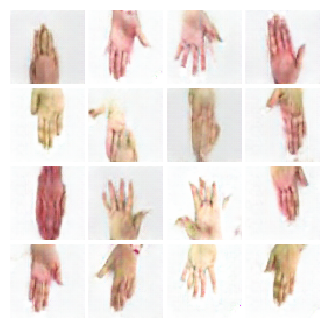


EPOCH:  49
Iter: 16750, D: 0.08106, G:3.608


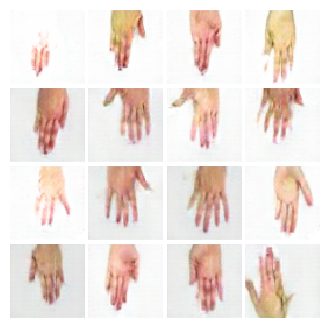


EPOCH:  50
Iter: 17000, D: 0.5207, G:5.585


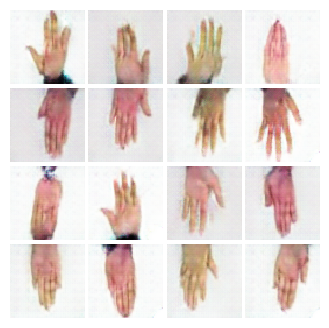


Iter: 17250, D: 0.03699, G:8.132


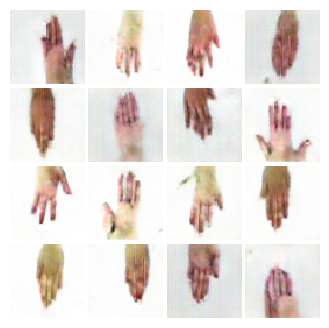

In [ ]:
# original gan
train(D, G, D_optimizer, G_optimizer, discriminator_loss,
          generator_loss, num_epochs=NUM_EPOCHS, in_channels = 3, img_size = 64, show_every=250,
          batch_size=batch_size, train_loader=hand_loader_train, device=device)